# METHODS FOR THE INFERENCE OF FORCES

Here we will explore the application of Neural Networks in inferring of forces parameters in three different cases: from one-dimensional to three-dimensional systems. 
- The implemented Neural Networks are variety of Recurrent Neural Netoworks (RNN) as [LSTM](https://keras.io/api/layers/recurrent_layers/lstm/) and [GRU](https://keras.io/api/layers/recurrent_layers/gru/). Moreover, we evaluated the use of [Attention](https://machinelearningmastery.com/adding-a-custom-attention-layer-to-recurrent-neural-network-in-keras/) to LSTM, GRU and a [Simple RNN](https://keras.io/api/layers/recurrent_layers/simple_rnn/).
- The cases of study are the harmonic potential, the double-well potential and the [Lorenz model (63)](https://matplotlib.org/stable/gallery/mplot3d/lorenz_attractor.html).
- The main objective of this study is to compare different Neural Network techniques in terms of their performance and effectiveness in estimating force parameters.


*Notes: we followed the work done in [Enhanced force-field calibration via machine
learning](https://doi.org/10.1063/5.0019105) where they developed the DeepCalib library.*

*Repository: [LCP-B](https://github.com/naisap/LCP_modB_exercises-project/tree/main/Final_Project_Force-fields/DNN_methods)*

In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
import os
from scipy.constants import Boltzmann as kB
from numpy.random import randn as gauss
from numpy.random import rand as uniform

from keras.models import load_model
import visualkeras
from PIL import ImageFont

from src_models import models_DNN, test_DNN, train_DNN
from data_generation import doublewell_potential_2d, doublewell_potential, harmonic_potential, lorenz_63

## 1. TRAJECTORY SIMULATION

Here it's defined the function that simulates the motion of a Brownian particle in the force field. 

*Comments:*
1. The function that simulates the trajectories is *simulate_trajectory*.
2. The number of parameter per case of study varies.

In [2]:
def plot_sample_trajectories(simulate_trajectory, number_of_trajectories_to_show, dim=1, n_target=2):
    
    import matplotlib.pyplot as plt
    inputs, inputs_real, targets, targets_real = simulate_trajectory(number_of_trajectories_to_show)
    
    if dim == 3:
        ## Lorenz 63

        xt = inputs_real[2].T
        N = len(xt)
        t = np.arange(0,N) 

        plt.figure(figsize=(20, 5)).suptitle('Lorenz Attractor')
        y_label = ['x','y','z']
        for i in range(3):
            plt.subplot(3,1,i+1)
            plt.plot(t,xt[:,i])
            plt.ylabel(y_label[i])
            plt.xlabel('timestep')
            if i == 0:
                plt.title('Parameter: {}, {}, {}'.format(r'$\sigma$: ' + str(round(targets_real[2][0],3)),r'$\rho$: ' + str(round(targets_real[2][1],3)),r'$\beta$: ' + str(round(targets_real[2][2],3))), fontsize=10)
            plt.grid(True)
            plt.subplots_adjust(hspace=0.3)

        fig = plt.figure(figsize=(20, 5))
        fig.suptitle('Lorenz Attractor - 3D')
        ax = fig.add_subplot(111, projection='3d')
        ax.plot(xt[:,0],xt[:,1],xt[:,2])
        ax.set_xlabel('x')
        ax.set_ylabel('y')
        ax.set_zlabel('z')
        ax.grid(True)
            
    if dim == 2:
        ## Double-weel 2D
        for scaled_values, scaled_targets, target_values in zip(inputs, targets, targets_real):
            plt.figure(figsize=(20, 5))    
            number_subplots = dim
            y_label = ['X[$\mu$m]','Y[$\mu$m]']
            for subplot in range(number_subplots):
                plt.subplot(1, number_subplots, subplot+1)
                plt.plot(scaled_values[subplot])
                plt.xlabel('timestep', fontsize=18)
                plt.ylabel(y_label[subplot], fontsize=18)   

                title_text = 'Parameters: ' 
                target_names = ['L[$\mu$m]','H[$k_B$T]']
                for parameter in range(len(target_values)):
                    title_text +=  ', ' + target_names[parameter] + ' = ' + '%1.2e' % target_values[parameter]
                plt.title(title_text, fontsize=18)


    if dim == 1:
        ## Harmonic & Double-weel
        for scaled_values, scaled_targets, target_values in zip(inputs, targets, targets_real):
            plt.figure(figsize=(20, 5))
            plt.plot(scaled_values)
            plt.xlabel('timestep', fontsize=18)
            plt.ylabel('x [$\mu$m]', fontsize=18)
            title_text = 'Parameters: ' 

            if n_target>1:
                targets_names = ['L[$\mu$m]','H[$k_B$T]']
                for parameter in range(n_target):
                    title_text +=  ', ' + targets_names[parameter] + ' = ' + '%1.2e' % target_values[parameter]
                plt.title(title_text, fontsize=18)  
            else:
                plt.title(title_text + ' ' + 'k[fN/\u03BCm]' + ' = ' + '%1.2e' % target_values , fontsize=18)  


#### Case 1D

##### Harmonic Potential

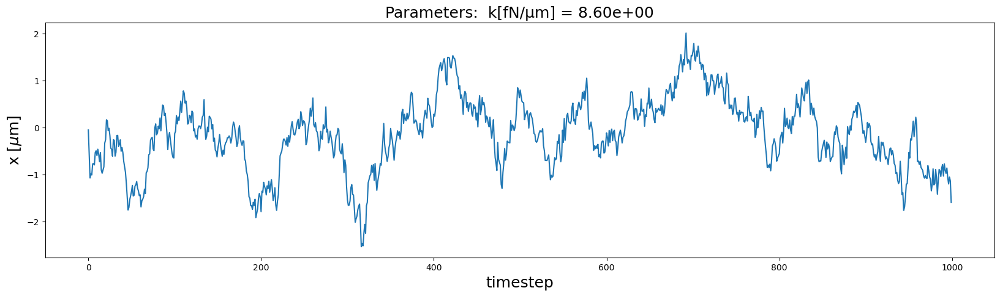

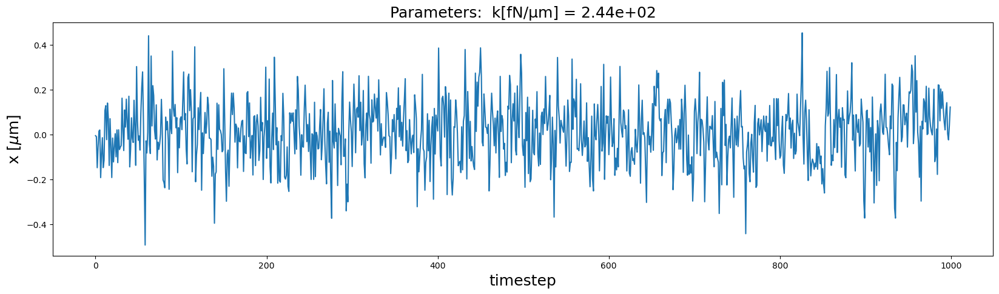

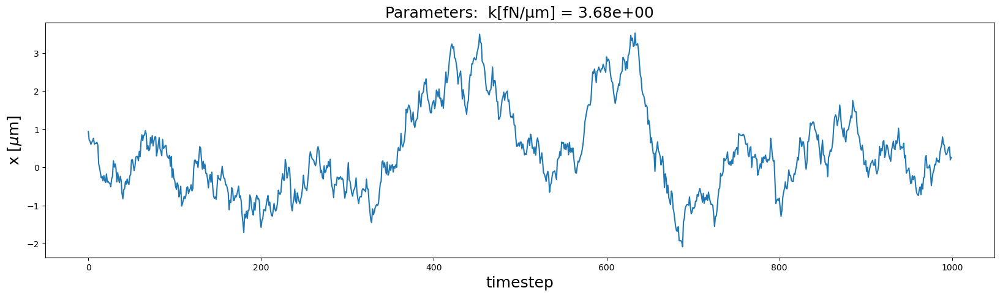

In [3]:
number_of_trajectories_to_show = 3
plot_sample_trajectories(harmonic_potential.simulate_trajectory, number_of_trajectories_to_show, dim=1, n_target=1)

##### Double-well Potential

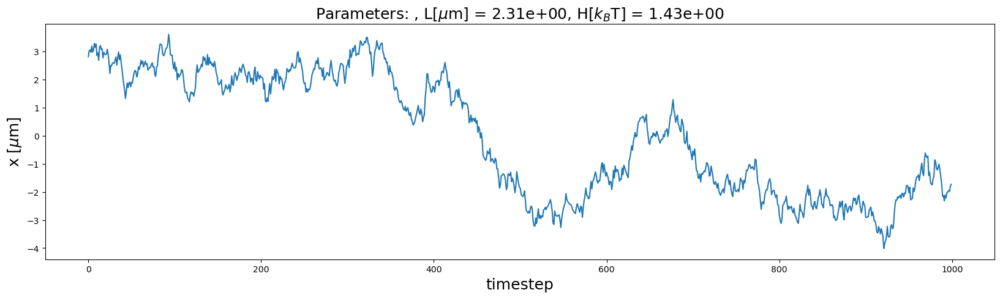

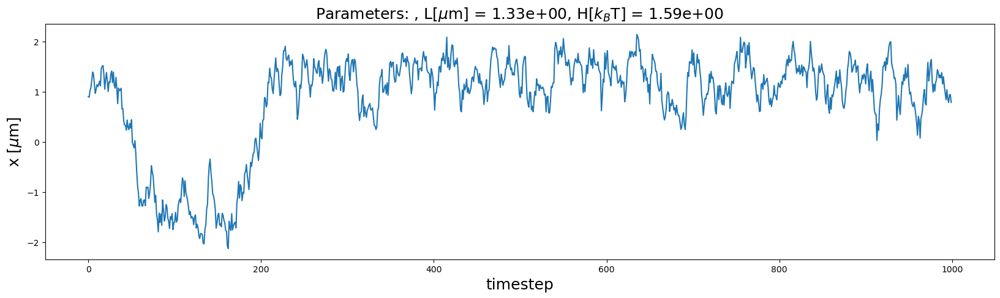

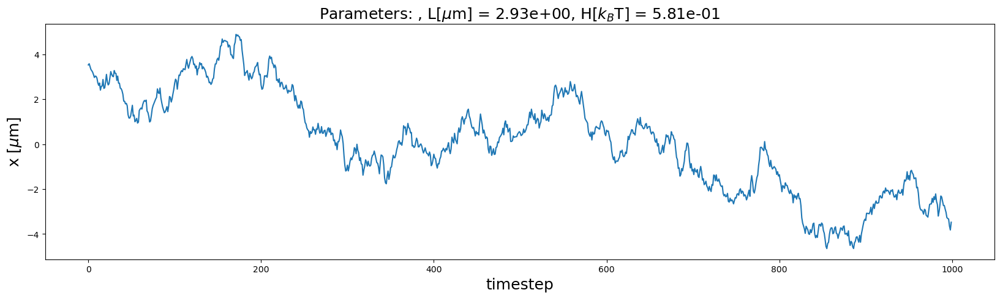

In [4]:
number_of_trajectories_to_show = 3
plot_sample_trajectories(doublewell_potential.simulate_trajectory, number_of_trajectories_to_show, dim=1)

#### Case 2D

##### Double-well Potential

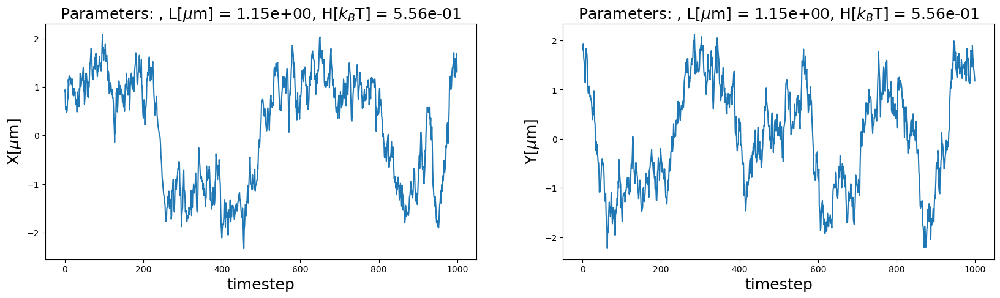

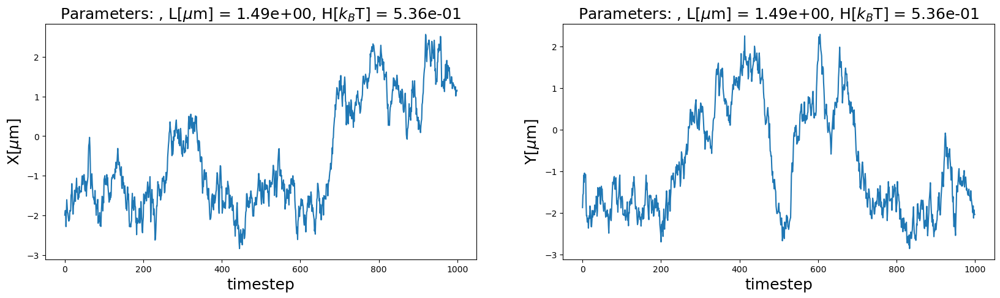

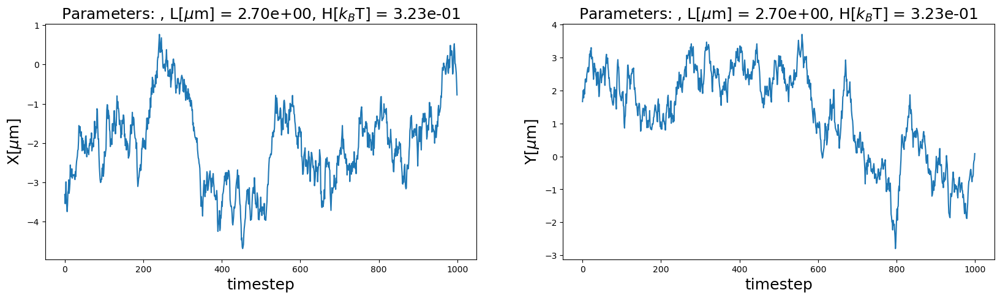

In [5]:
number_of_trajectories_to_show = 3
plot_sample_trajectories(doublewell_potential_2d.simulate_trajectory, number_of_trajectories_to_show, dim=2)

#### Case 3D

##### Lorentz Attractor (63)

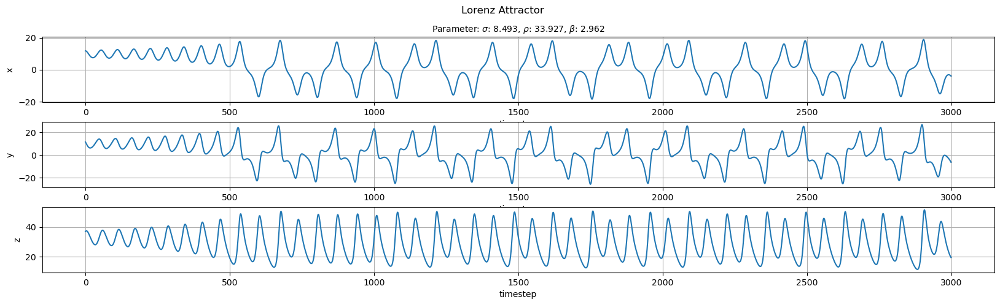

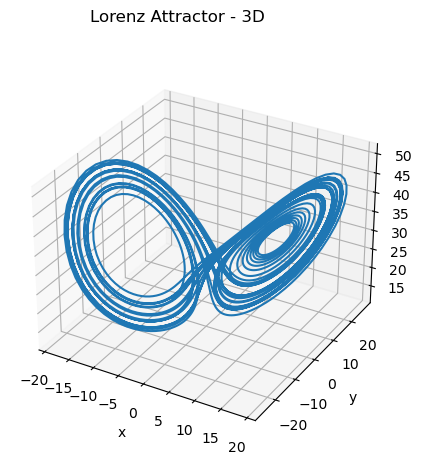

In [12]:
plot_sample_trajectories(lorenz_63.simulate_trajectory, number_of_trajectories_to_show, dim=3)

## 2. COMPARISON OF NEURAL NETWORKS TECHNIQUES

In [13]:
import pickle
def load_data(name):
    with open('{}.pkl'.format(name), 'rb') as f:
        file = pickle.load(f)
    return file

# file names

import glob
import os

result_path = os.getcwd() + '/result/'

files = glob.glob(result_path + '*.pkl', recursive = True)


### **VISUALIZATION OF NEURAL NETWORKS**

In [14]:
### Define parameters of the deep learning network
input_shape = (40, 50)      
lstm_layers_dimensions = (250, 50)
number_of_outputs = 2

DNN = 'GRU'
attention = False

### Create deep learning network
network_1 = models_DNN.create_deep_learning_network(input_shape, lstm_layers_dimensions, number_of_outputs, 
                                                      DNN,
                                                      attention)

DNN = 'LSTM'
attention = False

### Create deep learning network
network_2 = models_DNN.create_deep_learning_network(input_shape, lstm_layers_dimensions, number_of_outputs, 
                                                      DNN,
                                                      attention)

DNN = 'GRU'
attention = True

### Create deep learning network
network_3 = models_DNN.create_deep_learning_network(input_shape, lstm_layers_dimensions, number_of_outputs, 
                                                      DNN,
                                                      attention)

DNN = 'LSTM'
attention = True

### Create deep learning network
network_4 = models_DNN.create_deep_learning_network(input_shape, lstm_layers_dimensions, number_of_outputs, 
                                                      DNN,
                                                      attention)

DNN = 'SimpleRNN'
attention = True

### Create deep learning network
network_5 = models_DNN.create_deep_learning_network(input_shape, lstm_layers_dimensions, number_of_outputs, 
                                                      DNN,
                                                      attention)

#### GRU model

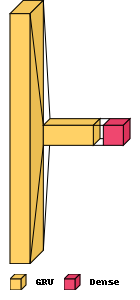

In [15]:
visualkeras.layered_view(network_1, legend=True, scale_xy=1, scale_z=1, max_z=1000)

#### LSTM model

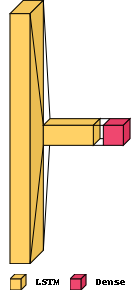

In [16]:
visualkeras.layered_view(network_2, legend=True, scale_xy=1, scale_z=1, max_z=1000)

#### GRU with attention model

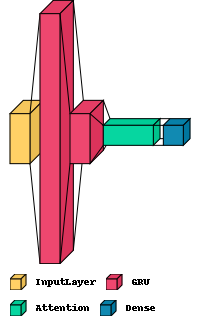

In [17]:
visualkeras.layered_view(network_3, legend=True, scale_xy=1, scale_z=1, max_z=1000)

#### LSTM with attention model

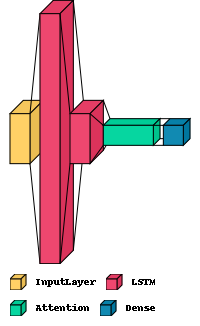

In [18]:
visualkeras.layered_view(network_4, legend=True, scale_xy=1, scale_z=1, max_z=1000)

#### SimpleRNN with attention model

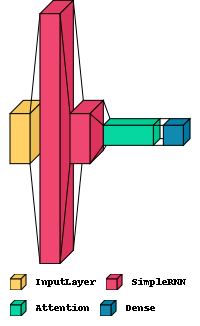

In [19]:
visualkeras.layered_view(network_5, legend=True, scale_xy=1, scale_z=1, max_z=1000)

### **PERFORMANCE OF THE MODELS**

In [20]:
def plot_learning_performance_summary(training_historyGRU, training_historyGRU_attention, training_historyLSTM, training_historyLSTM_attention, training_historySNN_attention, number_of_timesteps_for_average = 100, xmin = 3000, figsize=(22,22)):
    """Plot the learning performance of the deep learning network.
    
    Input:
    training_history: dictionary with training history, typically obtained from train_deep_learning_network()
    number_of_timesteps_for_average: length of the average [positive integer number]
    figsize: figure size [list of two positive numbers]
        
    Output: none
    """    

    import matplotlib.pyplot as plt
    from numpy import convolve, ones
    
    plt.figure(figsize=figsize)

    plt.subplot(5, 1, 1)
    #plt.semilogy(training_history['MSE'], 'k')
    plt.semilogy(convolve(training_historyGRU['MSE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'r', label="GRU")
    plt.semilogy(convolve(training_historyGRU_attention['MSE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'orange', label="GRU with attention")
    plt.semilogy(convolve(training_historyLSTM['MSE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'b', label = "LSTM")
    plt.semilogy(convolve(training_historyLSTM_attention['MSE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'g', label = "LSTM with attention")
    plt.semilogy(convolve(training_historySNN_attention['MSE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'black', label = "RNN with attention")
    plt.ylabel('MSE', fontsize=24)
    plt.xlabel('Epochs', fontsize=22)
    plt.grid(True, which="both")
    plt.legend()

    plt.subplot(5, 1, 2)
    plt.semilogy(convolve(training_historyGRU['MSE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'r', label="GRU: {}".format(round(sum(training_historyGRU['MSE'][xmin:])/len(training_historyGRU['MSE'][xmin:]), 5)))
    plt.semilogy(convolve(training_historyGRU_attention['MSE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'orange', label="GRU with attention: {}".format(round(sum(training_historyGRU_attention['MSE'][xmin:])/len(training_historyGRU_attention['MSE'][xmin:]), 5)))
    plt.semilogy(convolve(training_historyLSTM['MSE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'b', label = "LSTM: {}".format(round(sum(training_historyLSTM["MSE"][xmin:])/len(training_historyLSTM["MSE"][xmin:]), 5)))
    plt.semilogy(convolve(training_historyLSTM_attention['MSE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'g', label = "LSTM with attention: {}".format(round(sum(training_historyLSTM_attention["MSE"][xmin:])/len(training_historyLSTM_attention["MSE"][xmin:]), 5)))
    plt.semilogy(convolve(training_historySNN_attention['MSE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'black', label = "RNN with attention: {}".format(round(sum(training_historySNN_attention["MSE"][xmin:])/len(training_historySNN_attention["MSE"][xmin:]), 5)))
    plt.ylabel('MSE', fontsize=24)
    plt.xlabel('Epochs', fontsize=22)
    plt.legend()
    plt.grid(True, which="both")
    plt.xlim([xmin, 6000])

    plt.subplot(5, 1, 3)
    #plt.semilogy(training_history['MAE'], 'k')
    plt.semilogy(convolve(training_historyGRU['MAE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'r', label="GRU")
    plt.semilogy(convolve(training_historyGRU_attention['MAE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'orange', label="GRU with attention")
    plt.semilogy(convolve(training_historyLSTM['MAE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'b', label = "LSTM")
    plt.semilogy(convolve(training_historyLSTM_attention['MAE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'g', label = "LSTM with attention")
    plt.semilogy(convolve(training_historySNN_attention['MAE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'black', label = "RNN with attention")
    plt.ylabel('MAE', fontsize=24)
    plt.xlabel('Epochs', fontsize=22)
    plt.legend()
    plt.grid(True, which="both")


    plt.subplot(5, 1, 4)
    plt.semilogy(convolve(training_historyGRU['MAE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'r', label="GRU: {}".format(round(sum(training_historyGRU['MAE'][xmin:])/len(training_historyGRU['MAE'][xmin:]), 5)))
    plt.semilogy(convolve(training_historyGRU_attention['MAE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'orange', label="GRU with attention: {}".format(round(sum(training_historyGRU_attention['MAE'][xmin:])/len(training_historyGRU_attention['MAE'][xmin:]), 5)))
    plt.semilogy(convolve(training_historyLSTM['MAE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'b', label = "LSTM: {}".format(round(sum(training_historyLSTM["MAE"][xmin:])/len(training_historyLSTM["MAE"][xmin:]), 5)))
    plt.semilogy(convolve(training_historyLSTM_attention['MAE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'g', label = "LSTM with attention: {}".format(round(sum(training_historyLSTM_attention["MAE"][xmin:])/len(training_historyLSTM_attention["MAE"][xmin:]), 5)))
    plt.semilogy(convolve(training_historySNN_attention['MAE'], ones(number_of_timesteps_for_average) / number_of_timesteps_for_average, mode='valid'), 'black', label = "RNN with attention: {}".format(round(sum(training_historySNN_attention["MAE"][xmin:])/len(training_historySNN_attention["MAE"][xmin:]), 5)))
    plt.ylabel('MAE', fontsize=24)
    plt.xlabel('Epochs', fontsize=22)
    plt.legend()
    plt.grid(True, which="both")
    plt.xlim([xmin, 6000])

    plt.show()

### Case 1D

#### Harmonic potential

##### Physical parameters

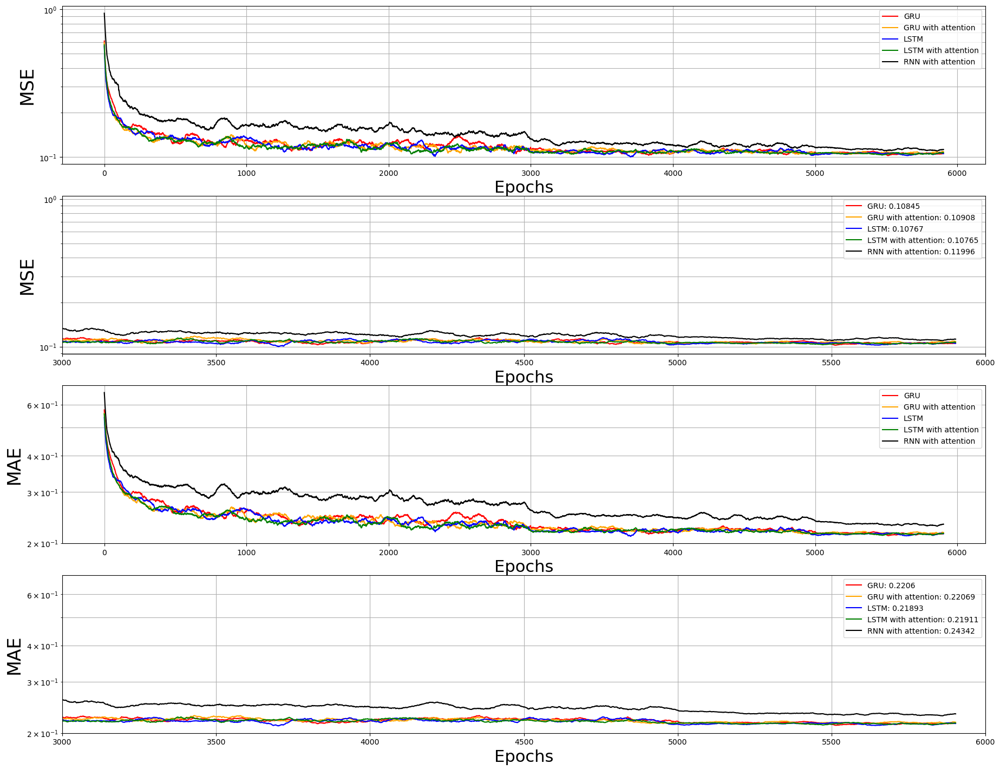

In [21]:
training_historyGRU = load_data(result_path + 'training_history_GRU_1D_harmonic')
training_historyGRU_attention = load_data(result_path + 'training_history_GRU_1D_harmonic_attention')
training_historyLSTM = load_data(result_path + 'training_history_LSTM_1D_harmonic')
training_historyLSTM_attention = load_data(result_path + 'training_history_LSTM_1D_harmonic_attention')
training_historyRNN_attention = load_data(result_path + 'training_history_SimpleRNN_1D_harmonic_attention')

number_of_timesteps_for_average = 100
plot_learning_performance_summary(training_historyGRU, training_historyGRU_attention, training_historyLSTM, training_historyLSTM_attention, training_historyRNN_attention)

The best performance for harmonic oscillator in 1D using physical parameter is given by the **LSTM with attention** method, until the 5th decimal digit.

##### Natural parameters

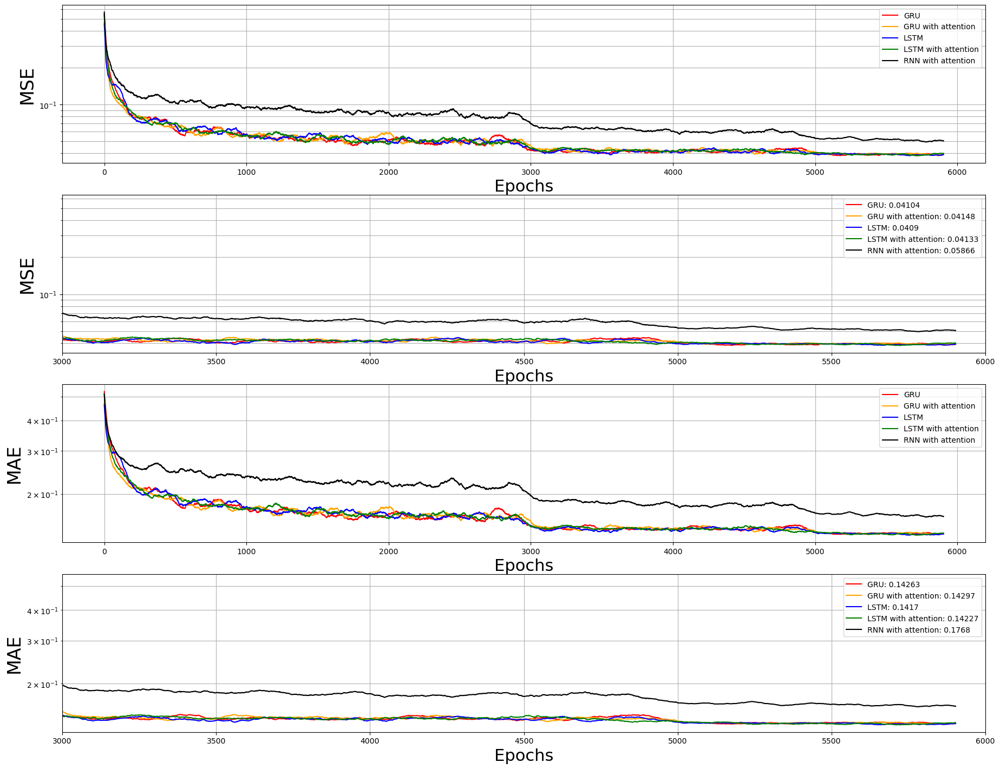

In [22]:
training_historyGRU = load_data(result_path + 'training_history_GRU_1D_harmonic_B')
training_historyGRU_attention = load_data(result_path + 'training_history_GRU_1D_harmonic_B_attention')
training_historyLSTM_attention = load_data(result_path + 'training_history_LSTM_1D_harmonic_B_attention')
training_historyLSTM = load_data(result_path + 'training_history_LSTM_1D_harmonic_B')
training_historyRNN_attention = load_data(result_path + 'training_history_SimpleRNN_1D_harmonic_B_attention')

number_of_timesteps_for_average = 100
plot_learning_performance_summary(training_historyGRU, training_historyGRU_attention, training_historyLSTM, training_historyLSTM_attention, training_historyRNN_attention)

The best performance for harmonic oscillator in 1D using natural parameters is given by the **LSTM** method followed by **GRU** method.

#### Double-well

##### Physical parameters

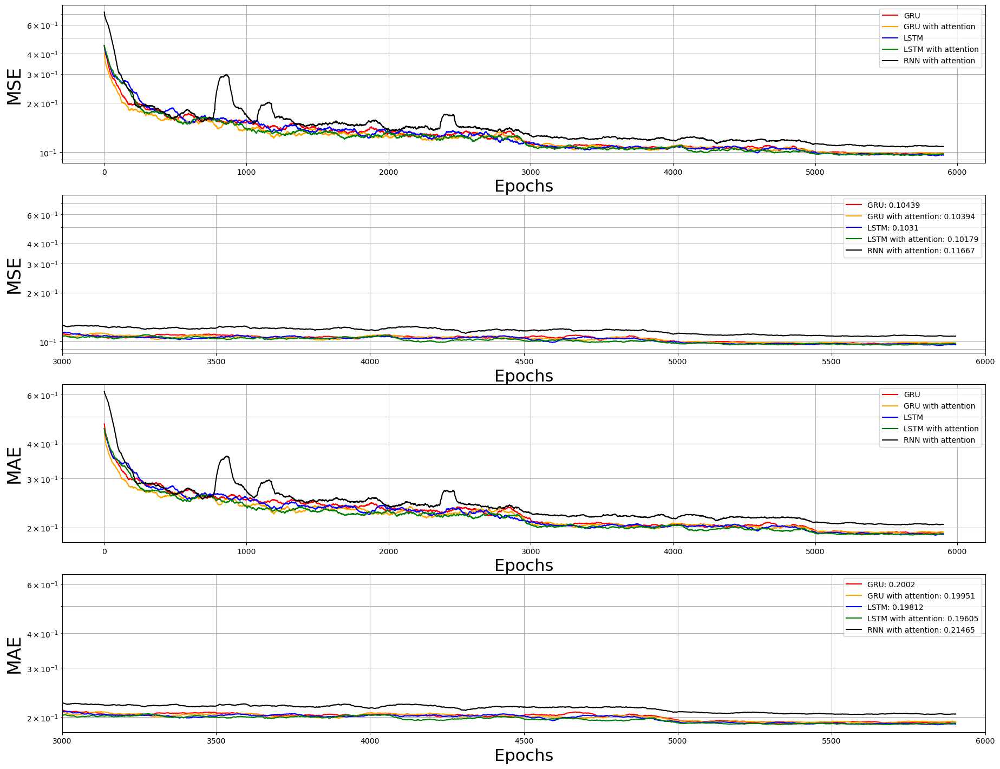

In [23]:
training_historyGRU = load_data(result_path + 'training_history_GRU_1D_double-well')
training_historyGRU_attention = load_data(result_path + 'training_history_GRU_1D_double-well_attention')
training_historyLSTM_attention = load_data(result_path + 'training_history_LSTM_1D_double-well_attention')
training_historyLSTM = load_data(result_path + 'training_history_LSTM_1D_double-well')
training_historyRNN_attention = load_data(result_path + 'training_history_SimpleRNN_1D_double-well_attention')

number_of_timesteps_for_average = 100
plot_learning_performance_summary(training_historyGRU, training_historyGRU_attention, training_historyLSTM, training_historyLSTM_attention, training_historyRNN_attention)

The best performance for double well in 1D using physical parameters is given by the **LSTM with attention** method.

##### Natural parameters

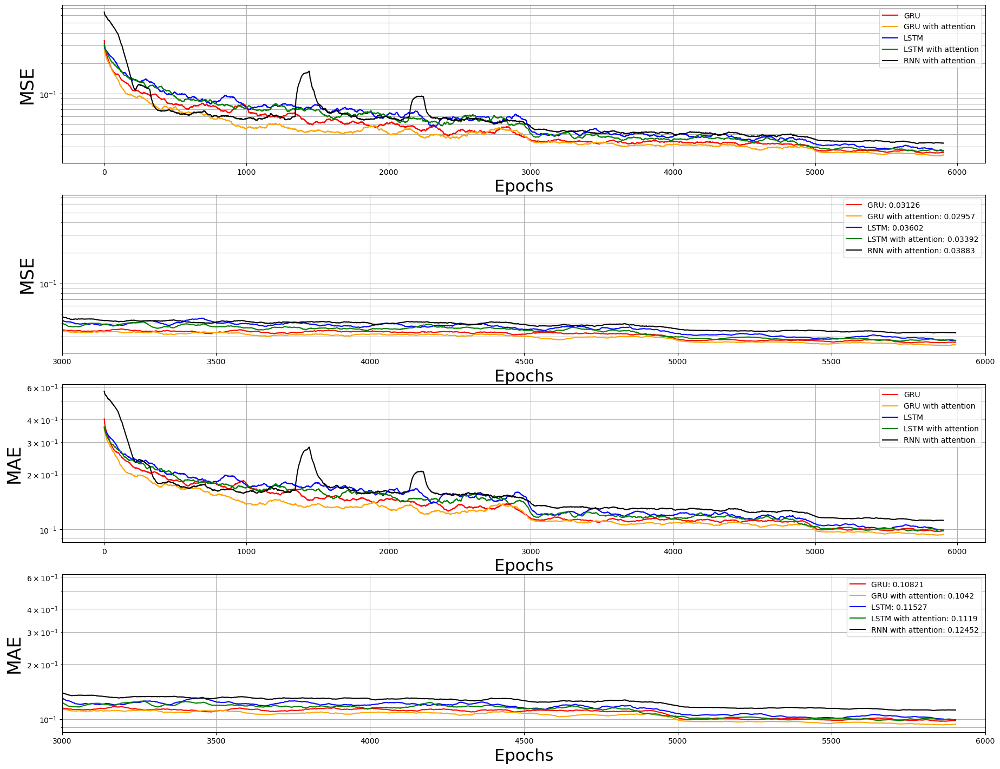

In [24]:
training_historyGRU = load_data(result_path + 'training_history_GRU_1D_double-well_B')
training_historyGRU_attention = load_data(result_path + 'training_history_GRU_1D_double-well_B_attention')
training_historyLSTM_attention = load_data(result_path + 'training_history_LSTM_1D_double-well_B_attention')
training_historyLSTM = load_data(result_path + 'training_history_LSTM_1D_double-well_B')
training_historyRNN_attention = load_data(result_path + 'training_history_SimpleRNN_1D_double-well_B_attention')

number_of_timesteps_for_average = 100
plot_learning_performance_summary(training_historyGRU, training_historyGRU_attention, training_historyLSTM, training_historyLSTM_attention, training_historyRNN_attention)

The best performance for double well in 1D using natural parameters is given by the **GRU with attention** method.

### Case 2D

#### Double-well

##### Physical parameters

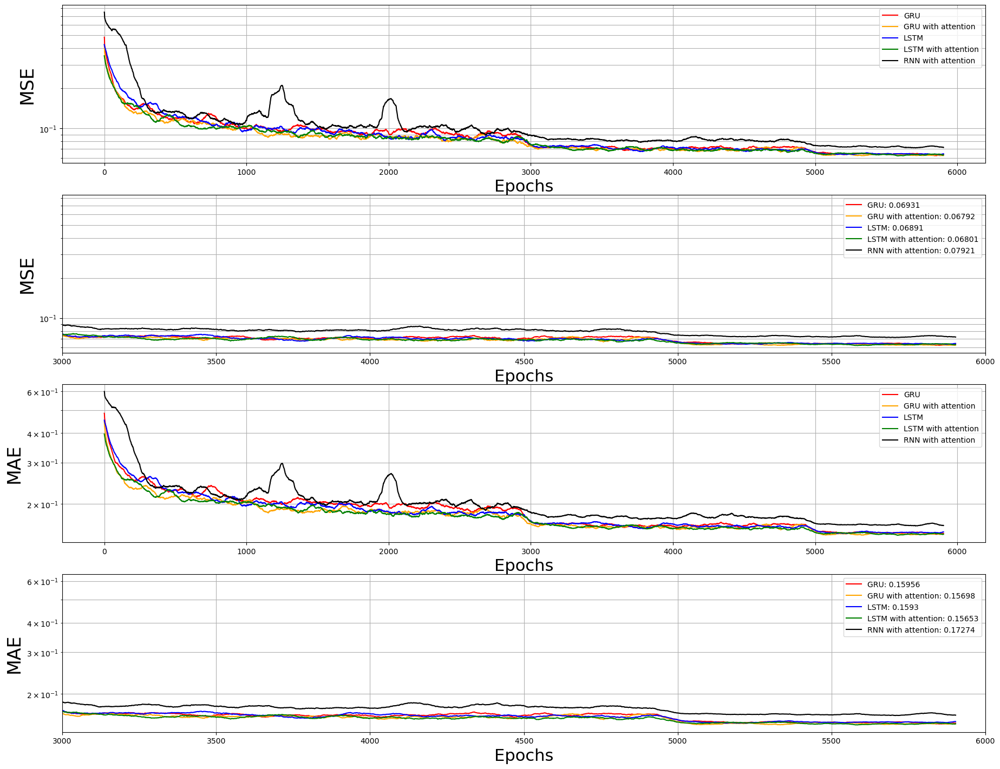

In [25]:
training_historyGRU = load_data(result_path + 'training_history_GRU_2D_double-well')
training_historyGRU_attention = load_data(result_path + 'training_history_GRU_2D_double-well_attention')
training_historyLSTM_attention = load_data(result_path + 'training_history_LSTM_2D_double-well_attention')
training_historyLSTM = load_data(result_path + 'training_history_LSTM_2D_double-well')
training_historyRNN_attention = load_data(result_path + 'training_history_SimpleRNN_2D_double-well_attention')

number_of_timesteps_for_average = 100
plot_learning_performance_summary(training_historyGRU, training_historyGRU_attention, training_historyLSTM, training_historyLSTM_attention, training_historyRNN_attention)

The best performance for double well in 2D using physical parameters is given by the **GRU with attention** method.

##### Natural parameters

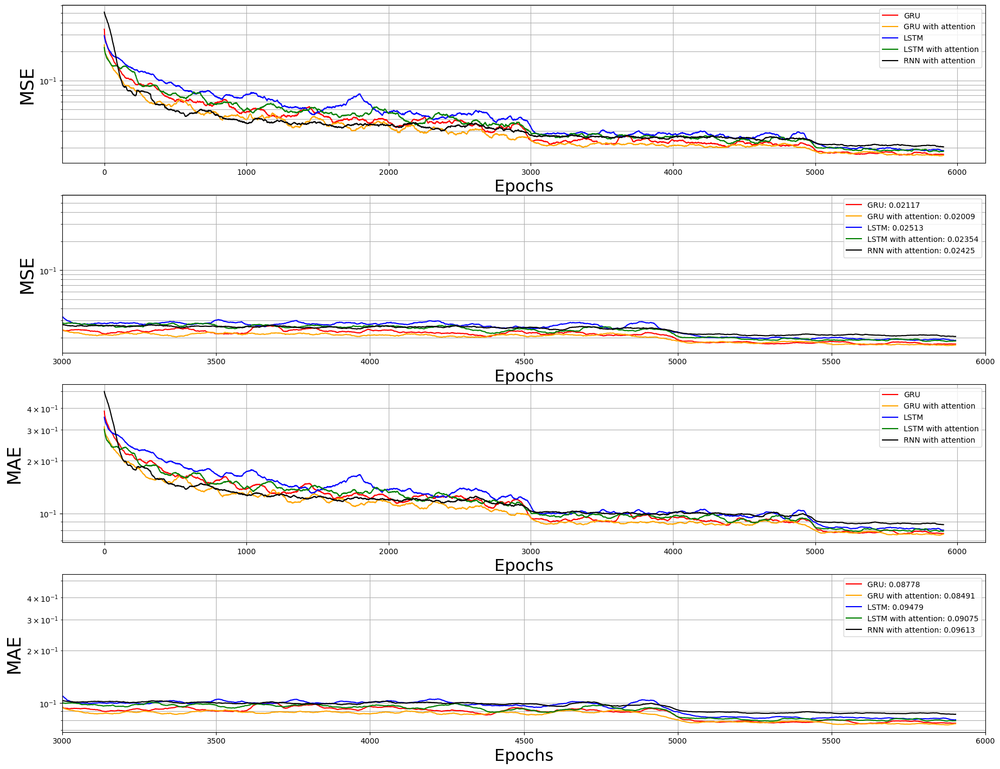

In [26]:
training_historyGRU = load_data(result_path + 'training_history_GRU_2D_double-well_B')
training_historyGRU_attention = load_data(result_path + 'training_history_GRU_2D_double-well_B_attention')
training_historyLSTM_attention = load_data(result_path + 'training_history_LSTM_2D_double-well_B_attention')
training_historyLSTM = load_data(result_path + 'training_history_LSTM_2D_double-well_B')
training_historyRNN_attention = load_data(result_path + 'training_history_SimpleRNN_2D_double-well_B_attention')

number_of_timesteps_for_average = 100
plot_learning_performance_summary(training_historyGRU, training_historyGRU_attention, training_historyLSTM, training_historyLSTM_attention, training_historyRNN_attention)

The best performance for double well in 2D using natural parameters is given by the **GRU with attention** method.

### Case 3D

#### Lorentz-63

##### Physical parameters

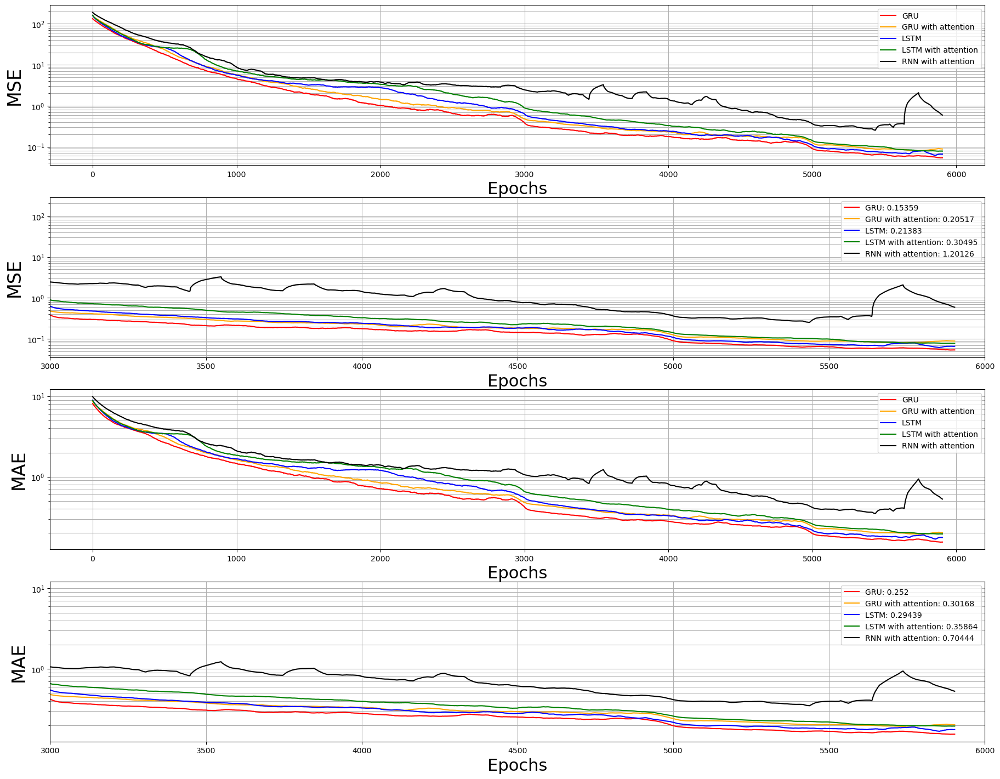

In [27]:
training_historyGRU = load_data(result_path + 'training_history_GRU_3D_lorentz')
training_historyGRU_attention = load_data(result_path + 'training_history_GRU_lorentz_attention')
training_historyLSTM_attention = load_data(result_path + 'training_history_LSTM_lorentz_attention')
training_historyLSTM = load_data(result_path + 'training_history_LSTM_3D_lorentz')
training_historyRNN_attention = load_data(result_path + 'training_history_SimpleRNN_lorentz_attention')

number_of_timesteps_for_average = 100
plot_learning_performance_summary(training_historyGRU, training_historyGRU_attention, training_historyLSTM, training_historyLSTM_attention, training_historyRNN_attention)

The best performance for double well in 2D using natural parameters is given by the **GRU** method.

### **PREDICTION OF THE MODEL**

### Case 1D

#### Harmonic potential

In [28]:
### Define parameters of the deep learning network
input_shape = (20, 50)      
lstm_layers_dimensions = (250, 50)
number_of_outputs = 1

DNN = 'GRU'
attention = True

### Create deep learning network
network3 = models_DNN.create_deep_learning_network(input_shape, lstm_layers_dimensions, number_of_outputs, 
                                                      DNN,
                                                      attention)

DNN = 'LSTM'
attention = True

### Create deep learning network
network4 = models_DNN.create_deep_learning_network(input_shape, lstm_layers_dimensions, number_of_outputs, 
                                                      DNN,
                                                      attention)

DNN = 'SimpleRNN'
attention = True

### Create deep learning network
network5 = models_DNN.create_deep_learning_network(input_shape, lstm_layers_dimensions, number_of_outputs, 
                                                      DNN,
                                                      attention)

##### Physical units

c:\Users\fap_9\Downloads\project\project\src_models\test_DNN.py:274: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  axs[0].plot(targets_scaled[ind], predictions_scaled.transpose()[ind], '.', color=plot_colors[i], marker=plot_markers[i], alpha=0.1)
c:\Users\fap_9\Downloads\project\project\src_models\test_DNN.py:285: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  axs[1].plot(targets_physical[ind], predictions_physical.transpose()[ind], '.', color=plot_colors[i], marker=plot_markers[i], alpha=0.1)


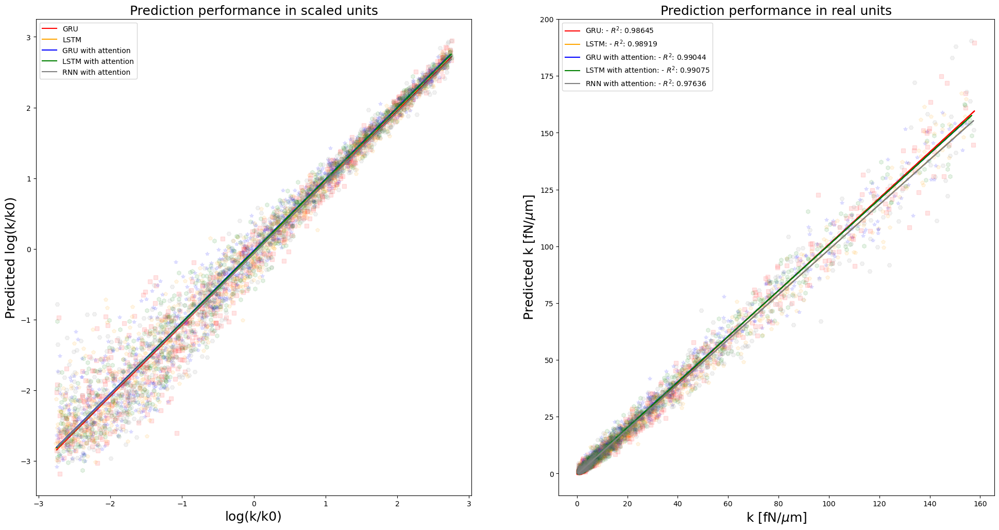

In [29]:
# networks
network1 = load_model(result_path + 'Network-model_GRU_1D_harmonic.h5')
network2 = load_model(result_path + 'Network-model_LSTM_1D_harmonic.h5')


networks = [network1, network2, network3, network4, network5]


# predictions
prediction_test1 = load_data(result_path + 'prediction_GRU_test_1D_harmonic')
prediction_test2 = load_data(result_path + 'prediction_LSTM_test_1D_harmonic')
prediction_test3 = load_data(result_path + 'prediction_GRU_test_1D_harmonic_attention')
prediction_test4 = load_data(result_path + 'prediction_LSTM_test_1D_harmonic_attention')
prediction_test5 = load_data(result_path + 'prediction_SimpleRNN_test_1D_harmonic_attention')

predictions = [prediction_test1, prediction_test2, prediction_test3, prediction_test4, prediction_test5]


test_DNN.plot_test_performance2(predictions, networks, "harmonic")

##### Natural units

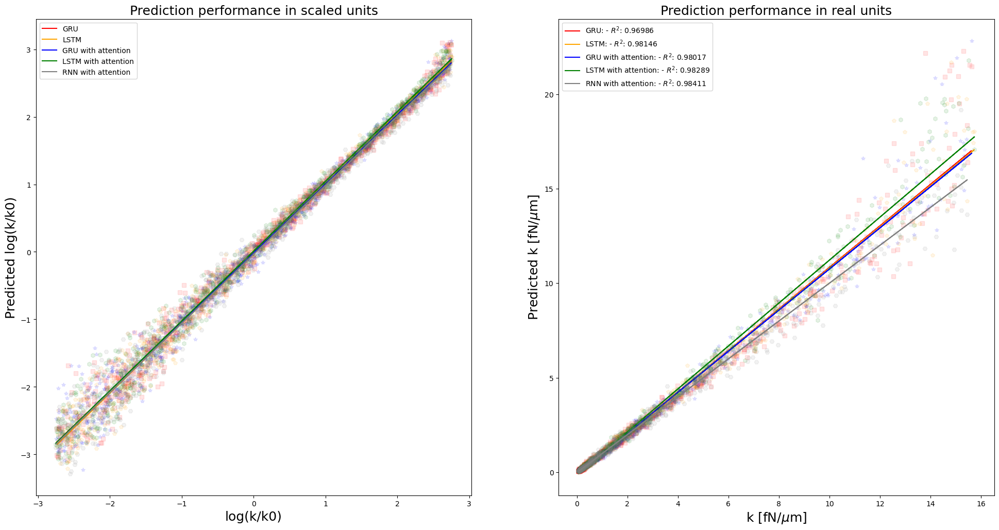

In [30]:
# networks
network1 = load_model(result_path + 'Network-model_GRU_1D_harmonic.h5')
network2 = load_model(result_path + 'Network-model_LSTM_1D_harmonic.h5')

networks = [network1, network2, network3, network4, network5]

# predictions
prediction_test1 = load_data(result_path + 'prediction_GRU_test_1D_harmonic_B')
prediction_test2 = load_data(result_path + 'prediction_LSTM_test_1D_harmonic_B')
prediction_test3 = load_data(result_path + 'prediction_GRU_test_1D_harmonic_B_attention')
prediction_test4 = load_data(result_path + 'prediction_LSTM_test_1D_harmonic_B_attention')
prediction_test5 = load_data(result_path + 'prediction_SimpleRNN_test_1D_harmonic_B_attention')

predictions = [prediction_test1, prediction_test2, prediction_test3, prediction_test4, prediction_test5]

test_DNN.plot_test_performance2(predictions, networks, "harmonic")

#### Double Well

In [31]:
### Define parameters of the deep learning network
input_shape = (20, 50)      
lstm_layers_dimensions = (250, 50)
number_of_outputs = 2

DNN = 'GRU'
attention = True

### Create deep learning network
network3 = models_DNN.create_deep_learning_network(input_shape, lstm_layers_dimensions, number_of_outputs, 
                                                      DNN,
                                                      attention)

DNN = 'LSTM'
attention = True

### Create deep learning network
network4 = models_DNN.create_deep_learning_network(input_shape, lstm_layers_dimensions, number_of_outputs, 
                                                      DNN,
                                                      attention)

DNN = 'SimpleRNN'
attention = True

### Create deep learning network
network5 = models_DNN.create_deep_learning_network(input_shape, lstm_layers_dimensions, number_of_outputs, 
                                                      DNN,
                                                      attention)

##### Physical units

c:\Users\fap_9\Downloads\project\project\src_models\test_DNN.py:218: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  axs[target_number,0].plot(targets_scaled[target_number],
c:\Users\fap_9\Downloads\project\project\src_models\test_DNN.py:244: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  axs[target_number,1].plot(targets_physical[target_number],
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


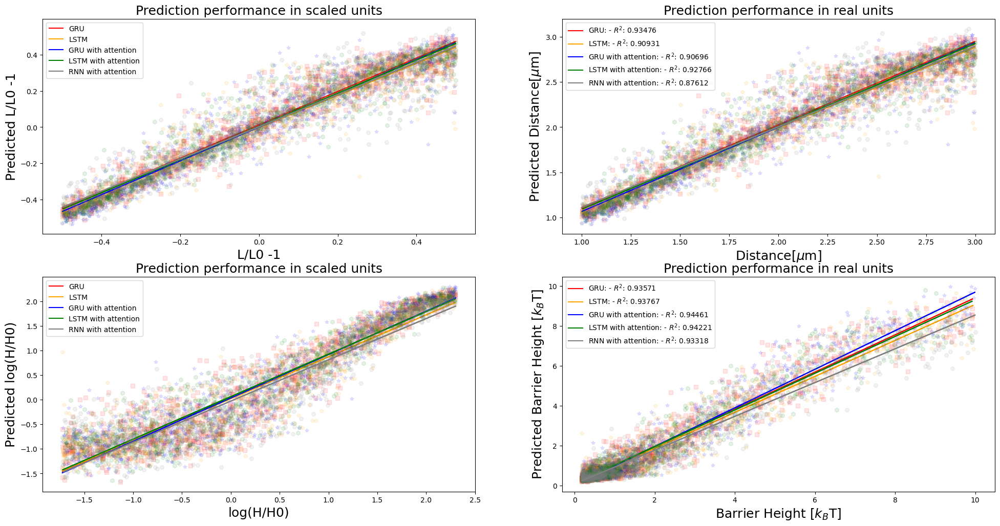

In [32]:
# networks
network1 = load_model(result_path + 'Network-model_GRU_1D_double-well.h5')
network2 = load_model(result_path + 'Network-model_LSTM_1D_double-well.h5')

networks = [network1, network2, network3, network4, network5]

# predictions
prediction_test1 = load_data(result_path + 'prediction_GRU_test_1D_double-well')
prediction_test2 = load_data(result_path + 'prediction_LSTM_test_1D_double-well')
prediction_test3 = load_data(result_path + 'prediction_GRU_test_1D_double-well_attention')
prediction_test4 = load_data(result_path + 'prediction_LSTM_test_1D_double-well_attention')
prediction_test5 = load_data(result_path + 'prediction_SimpleRNN_test_1D_double-well_attention')

predictions = [prediction_test1, prediction_test2, prediction_test3, prediction_test4, prediction_test5]


test_DNN.plot_test_performance2(predictions, networks, "double-well")

##### Natural units

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


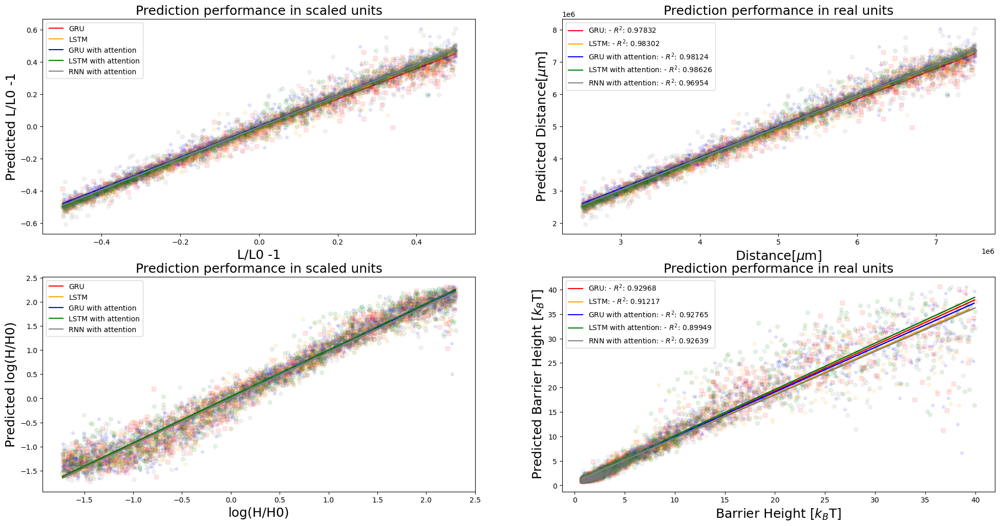

In [33]:
# networks
network1 = load_model(result_path + 'Network-model_GRU_1D_double-well_B.h5')
network2 = load_model(result_path + 'Network-model_LSTM_1D_double-well_B.h5')

networks = [network1, network2, network3, network4, network5]

# predictions
prediction_test1 = load_data(result_path + 'prediction_GRU_test_1D_double-well_B')[:500]
prediction_test2 = load_data(result_path + 'prediction_LSTM_test_1D_double-well_B')[:500]
prediction_test3 = load_data(result_path + 'prediction_GRU_test_1D_double-well_B_attention')[:500]
prediction_test4 = load_data(result_path + 'prediction_LSTM_test_1D_double-well_B_attention')[:500]
prediction_test5 = load_data(result_path + 'prediction_SimpleRNN_test_1D_double-well_B_attention')[:500]

predictions = [prediction_test1, prediction_test2, prediction_test3, prediction_test4, prediction_test5]

test_DNN.plot_test_performance2(predictions, networks, "double-well")

### Case 2D

#### Double Well

In [34]:
### Define parameters of the deep learning network
input_shape = (40, 50)      
lstm_layers_dimensions = (250, 50)
number_of_outputs = 2

DNN = 'GRU'
attention = True

### Create deep learning network
network3 = models_DNN.create_deep_learning_network(input_shape, lstm_layers_dimensions, number_of_outputs, 
                                                      DNN,
                                                      attention)

DNN = 'LSTM'
attention = True

### Create deep learning network
network4 = models_DNN.create_deep_learning_network(input_shape, lstm_layers_dimensions, number_of_outputs, 
                                                      DNN,
                                                      attention)

DNN = 'SimpleRNN'
attention = True

### Create deep learning network
network5 = models_DNN.create_deep_learning_network(input_shape, lstm_layers_dimensions, number_of_outputs, 
                                                      DNN,
                                                      attention)

##### Physical units

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


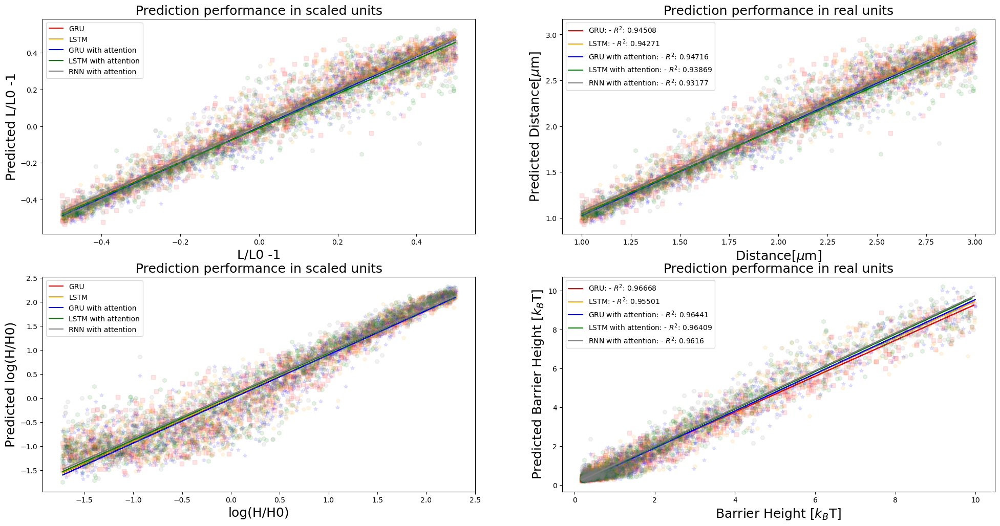

In [35]:
# networks
network1 = load_model(result_path + 'Network-model_GRU_2D_double-well.h5')
network2 = load_model(result_path + 'Network-model_LSTM_2D_double-well.h5')

networks = [network1, network2, network3, network4, network5]

# predictions
prediction_test1 = load_data(result_path + 'prediction_GRU_test_2D_double-well')[:500]
prediction_test2 = load_data(result_path + 'prediction_LSTM_test_2D_double-well')[:500]
prediction_test3 = load_data(result_path + 'prediction_GRU_test_2D_double-well_attention')[:500]
prediction_test4 = load_data(result_path + 'prediction_LSTM_test_2D_double-well_attention')[:500]
prediction_test5 = load_data(result_path + 'prediction_SimpleRNN_test_2D_double-well_attention')[:500]

predictions = [prediction_test1, prediction_test2, prediction_test3, prediction_test4, prediction_test5]

test_DNN.plot_test_performance2(predictions, networks, "double-well")

##### Natural Units

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


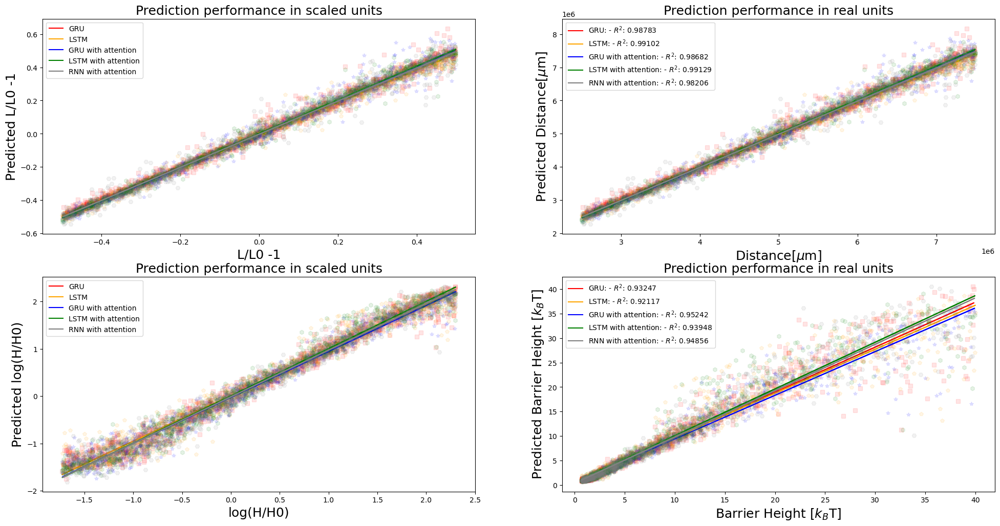

In [36]:
# networks
network1 = load_model(result_path + 'Network-model_GRU_2D_double-well_B.h5')
network2 = load_model(result_path + 'Network-model_LSTM_2D_double-well_B.h5')

networks = [network1, network2, network3, network4, network5]

# predictions
prediction_test1 = load_data(result_path + 'prediction_GRU_test_2D_double-well_B')[:500]
prediction_test2 = load_data(result_path + 'prediction_LSTM_test_2D_double-well_B')[:500]
prediction_test3 = load_data(result_path + 'prediction_GRU_test_2D_double-well_B_attention')[:500]
prediction_test4 = load_data(result_path + 'prediction_LSTM_test_2D_double-well_B_attention')[:500]
prediction_test5 = load_data(result_path + 'prediction_SimpleRNN_test_2D_double-well_B_attention')[:500]

predictions = [prediction_test1, prediction_test2, prediction_test3, prediction_test4, prediction_test5]

test_DNN.plot_test_performance2(predictions, networks, "double-well")

### Case 3D

#### Lorenz-63 attractor

Physical Units

In [37]:
### Define parameters of the deep learning network
input_shape = (180, 50)      
lstm_layers_dimensions = (250, 50)
number_of_outputs = 3

DNN = 'GRU'
attention = True

### Create deep learning network
network3 = models_DNN.create_deep_learning_network(input_shape, lstm_layers_dimensions, number_of_outputs, 
                                                      DNN,
                                                      attention)

DNN = 'LSTM'
attention = True

### Create deep learning network
network4 = models_DNN.create_deep_learning_network(input_shape, lstm_layers_dimensions, number_of_outputs, 
                                                      DNN,
                                                      attention)

DNN = 'SimpleRNN'
attention = True

### Create deep learning network
network5 = models_DNN.create_deep_learning_network(input_shape, lstm_layers_dimensions, number_of_outputs, 
                                                      DNN,
                                                      attention)

c:\Users\fap_9\Downloads\project\project\src_models\test_DNN.py:199: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  axs[target_number].plot(targets_physical[target_number],


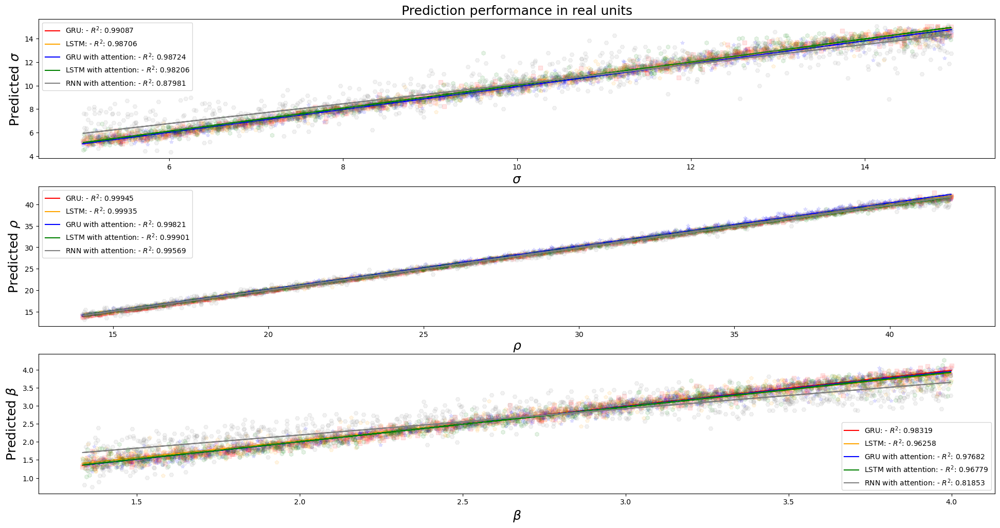

In [38]:
# networks
network1 = load_model(result_path + 'Network-model_GRU_lorenz.h5')
network2 = load_model(result_path + 'Network-model_LSTM_lorentz.h5')

networks = [network1, network2, network3, network4, network5]

# predictions
prediction_test1 = load_data(result_path + 'prediction_GRU_test_lorenz') 
prediction_test2 = load_data(result_path + 'prediction_LSTM_test_lorenz')
prediction_test3 = load_data(result_path + 'prediction_GRU_test_lorentz_attention')
prediction_test4 = load_data(result_path + 'prediction_LSTM_test_lorentz_attention')
prediction_test5 = load_data(result_path + 'prediction_SimpleRNN_test_lorentz_attention')

predictions = [prediction_test1, prediction_test2, prediction_test3, prediction_test4, prediction_test5]

test_DNN.plot_test_performance2(predictions, networks, "lorenz_63")